<a href="https://colab.research.google.com/github/kthhtk/AIFFEL_Quest_cr/blob/master/Project/03/10_3_project02_Object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip3 install tensorflow-estimator==2.6.0

In [ ]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

In [ ]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [ ]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False):

  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [ ]:
def draw_bounding_box_on_image(image,
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):

  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]

  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height

  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

In [ ]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

In [ ]:
# 아래 코드가 AttributeError: module 'PIL.Image' has no attribute 'ANTIALIAS' 오류가 떠서 해결책
!pip uninstall pillow
!pip install Pillow==9.5.0

Found existing installation: pillow 11.0.0
Uninstalling pillow-11.0.0:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/PIL/*
    /usr/local/lib/python3.10/dist-packages/pillow-11.0.0.dist-info/*
    /usr/local/lib/python3.10/dist-packages/pillow.libs/libXau-154567c4.so.6.0.0
    /usr/local/lib/python3.10/dist-packages/pillow.libs/libbrotlicommon-3ecfe81c.so.1
    /usr/local/lib/python3.10/dist-packages/pillow.libs/libbrotlidec-ba690955.so.1
    /usr/local/lib/python3.10/dist-packages/pillow.libs/libfreetype-e7d5437d.so.6.20.1
    /usr/local/lib/python3.10/dist-packages/pillow.libs/libharfbuzz-144af51e.so.0
    /usr/local/lib/python3.10/dist-packages/pillow.libs/libjpeg-45e70d75.so.62.4.0
    /usr/local/lib/python3.10/dist-packages/pillow.libs/liblcms2-e69eef39.so.2.0.16
    /usr/local/lib/python3.10/dist-packages/pillow.libs/liblzma-c9407571.so.5.6.3
    /usr/local/lib/python3.10/dist-packages/pillow.libs/libopenjp2-05423b53.so
    /usr/local/lib/python3.10/dist-packages/pi

<ipython-input-4-aa2905205e73>:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정


Image downloaded to /tmp/tmp1wsvum7e.jpg.


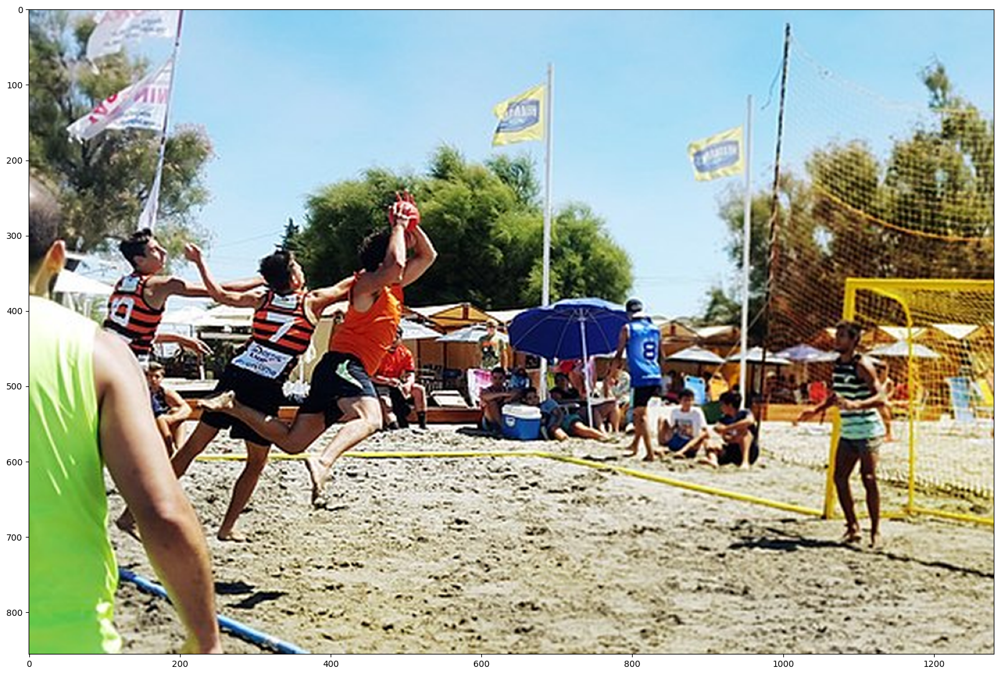

In [ ]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

In [ ]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

In [ ]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [ ]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  50.2962212562561


<ipython-input-5-8b156eaed91c>:19: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-5-8b156eaed91c>:29: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


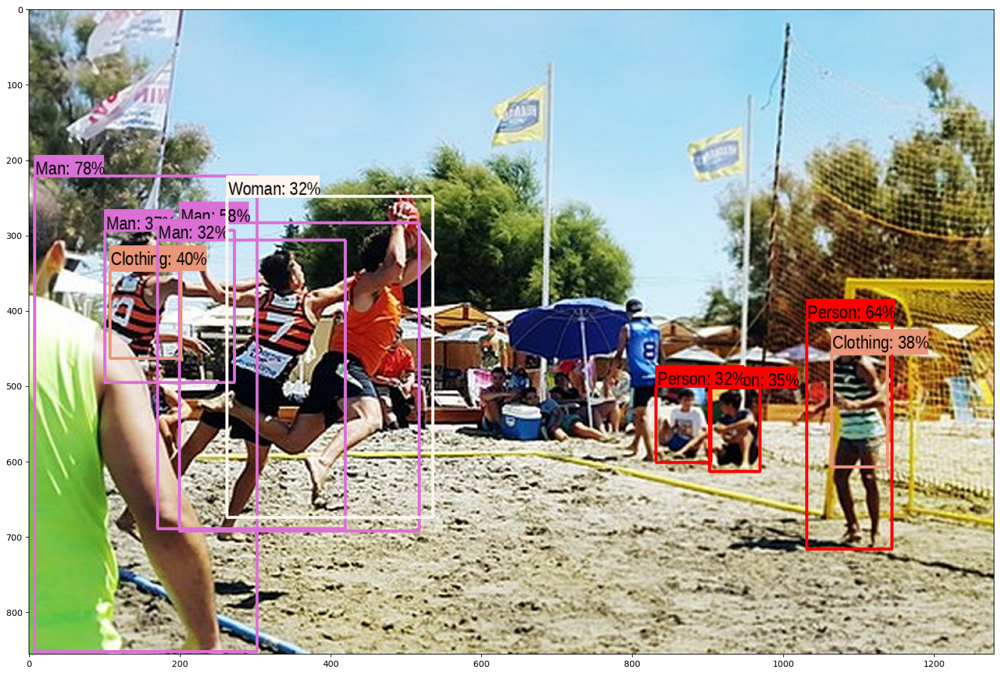

In [ ]:
run_detector(detector, downloaded_image_path)

<ipython-input-4-aa2905205e73>:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정


Image downloaded to /tmp/tmp6tksnk5d.jpg.


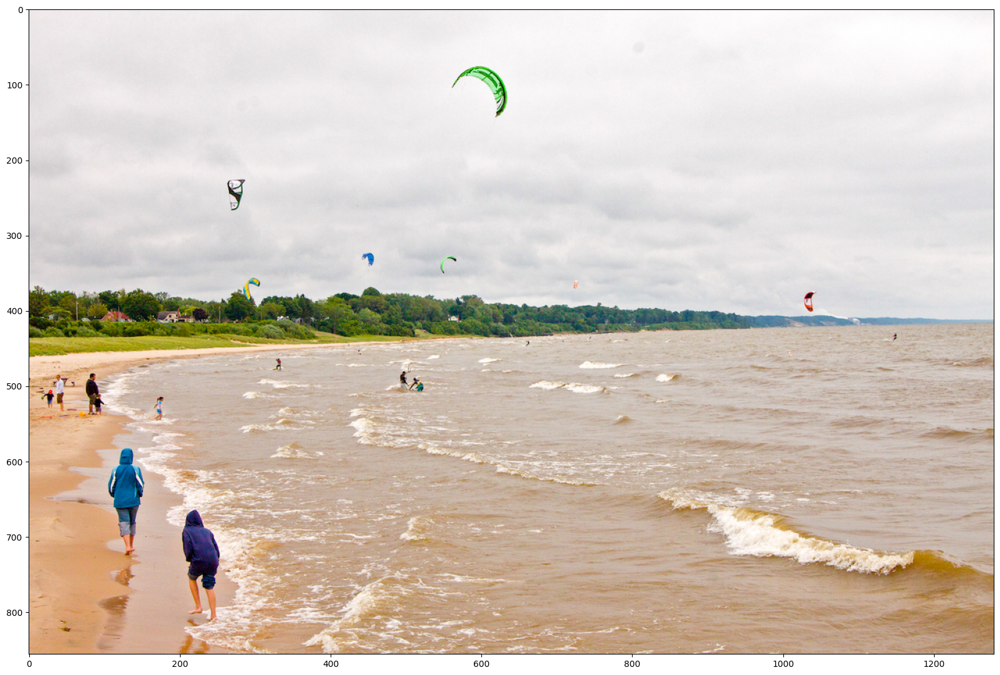

In [ ]:
# 이미지 불러오기
# 이미지 URL 설정 및 이미지 다운로드/리사이즈
image_url = "https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/test_images/image2.jpg"    # 처리할 이미지의 URL 지정
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)    # 이미지를 다운로드하고 1280x856 크기로 리사이즈, True는 이미지 표시 옵션

# 이미지 불러오기
image_np = plt.imread(downloaded_image_path)    # 다운로드된 이미지를 numpy 배열로 읽어오기

Found 100 objects.
Inference time:  1.995009422302246


<ipython-input-5-8b156eaed91c>:19: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-5-8b156eaed91c>:29: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


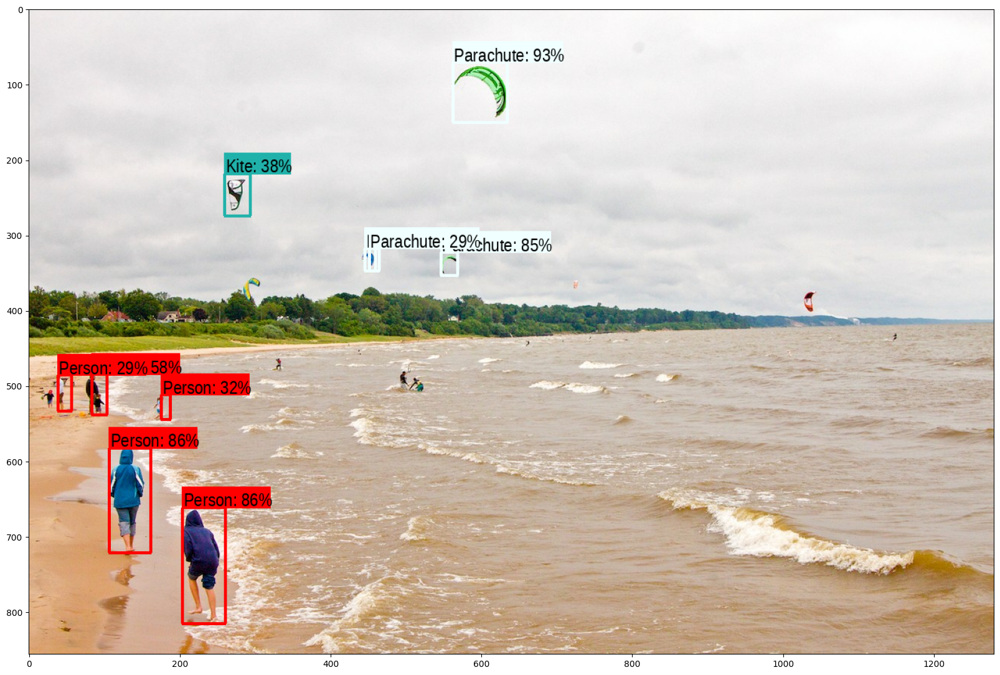

In [ ]:
# 테스트
run_detector(detector, downloaded_image_path)

#문제 2-2 다양한 pre-trained model 테스트해보기

In [2]:
# YOLOv8 모델과 필요한 라이브러리 설치
!pip install ultralytics      # ultralytics는 YOLO 객체 탐지 모델을 쉽게 사용할 수 있게 해주는 라이브러리입니다
                              # YOLOv8은 실시간 객체 탐지가 가능한 최신 버전의 YOLO 모델입니다



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.5/898.5 kB 13.8 MB/s eta 0:00:00


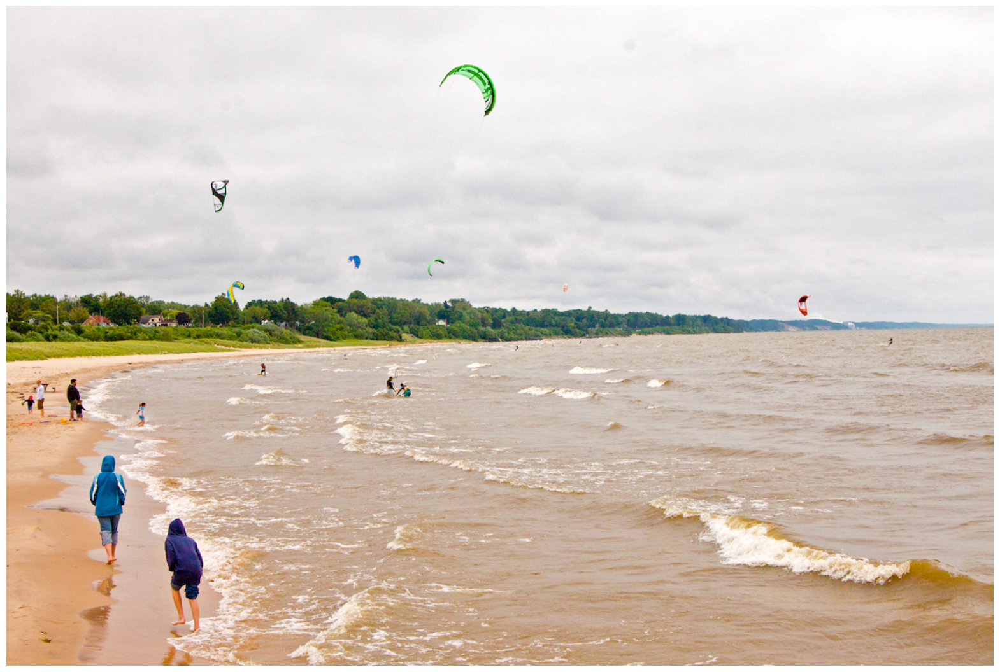


0: 448x640 9 persons, 5 kites, 229.3ms
Speed: 3.4ms preprocess, 229.3ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)
Class: kite, Confidence: 0.90
Bounding Box: (560.7, 74.4, 634.6, 143.8)
Class: person, Confidence: 0.84
Bounding Box: (106.2, 581.4, 156.4, 722.9)
Class: kite, Confidence: 0.83
Bounding Box: (264.4, 225.9, 288.4, 269.4)
Class: person, Confidence: 0.82
Bounding Box: (203.6, 664.8, 257.1, 813.7)
Class: person, Confidence: 0.63
Bounding Box: (76.7, 482.7, 100.4, 538.3)
Class: kite, Confidence: 0.53
Bounding Box: (545.5, 327.2, 567.6, 353.7)
Class: person, Confidence: 0.47
Bounding Box: (33.1, 486.1, 51.0, 529.8)
Class: person, Confidence: 0.46
Bounding Box: (168.4, 514.0, 184.4, 544.8)
Class: person, Confidence: 0.45
Bounding Box: (1026.4, 374.0, 1041.9, 403.1)
Class: person, Confidence: 0.39
Bounding Box: (510.1, 492.9, 526.6, 508.5)
Class: kite, Confidence: 0.36
Bounding Box: (288.3, 356.5, 309.8, 393.2)
Class: kite, Confidence: 0.30
Bounding Box: (44

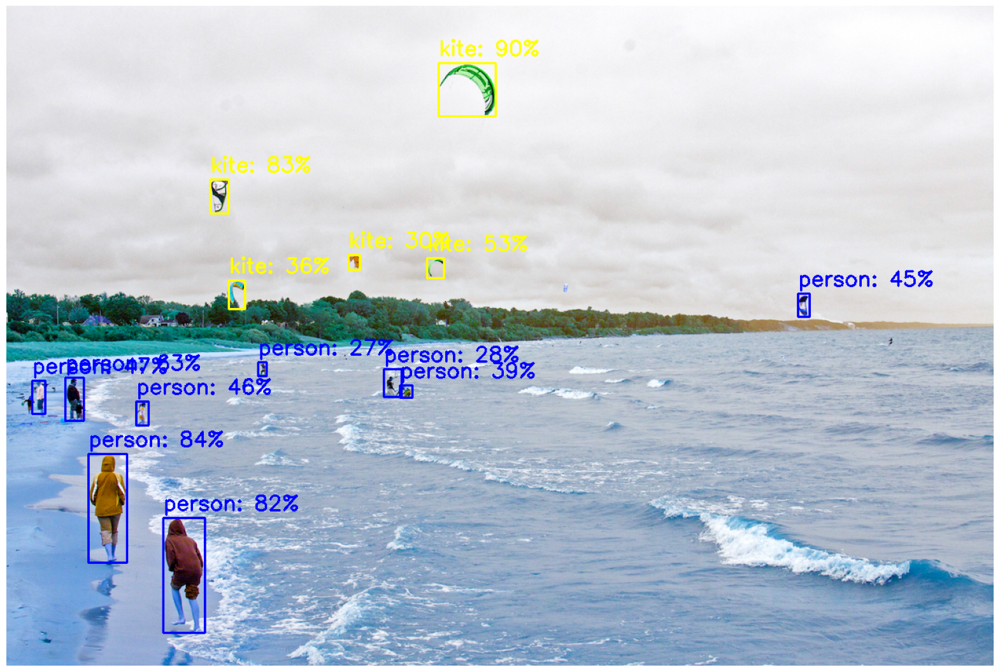

In [8]:
# 필요한 라이브러리 임포트
from ultralytics import YOLO  # YOLOv8: 최신 버전의 실시간 객체 탐지 모델
import cv2  # OpenCV: 이미지 처리 및 컴퓨터 비전 작업을 위한 라이브러리
import urllib.request  # URL에서 파일을 다운로드하기 위한 라이브러리
import numpy as np  # 수치 계산과 배열 처리를 위한 라이브러리
import matplotlib.pyplot as plt  # 데이터 시각화를 위한 라이브러리
from PIL import Image  # Python Imaging Library: 이미지 처리를 위한 라이브러리
import io  # 입출력 스트림 처리를 위한 라이브러리

def download_and_resize_image(url, new_width=1280, new_height=856, display=True):
    # URL에서 이미지를 다운로드하고 지정된 크기로 리사이즈하는 함수
    with urllib.request.urlopen(url) as response:  # URL 열기 및 응답 받기
        image_data = response.read()  # 이미지 데이터를 바이트 형태로 읽기

    # 바이트 데이터를 PIL Image 객체로 변환
    image = Image.open(io.BytesIO(image_data))  # 메모리 내 바이트 스트림을 이미지로 변환
    image = image.resize((new_width, new_height))  # 지정된 크기로 이미지 리사이즈

    if display:  # display 옵션이 True인 경우
        plt.figure(figsize=(20, 15))  # 그림 크기 설정
        plt.imshow(image)  # 이미지 표시
        plt.axis('off')  # 축 눈금 제거
        plt.show()  # 그래프 표시

    return np.array(image)  # PIL Image를 numpy 배열로 변환하여 반환

def load_model():
    # YOLOv8 모델을 로드하는 함수
    model = YOLO('yolov8n.pt')  # 사전 훈련된 YOLOv8 nano 모델 로드
    return model  # 로드된 모델 반환

def run_detector(detector, image_np):
    # 객체 탐지를 수행하고 결과를 시각화하는 함수
    results = detector(image_np)  # 입력 이미지에 대해 객체 탐지 수행

    img_with_boxes = image_np.copy()  # 원본 이미지 복사 (시각화를 위해)

    # 각 탐지 결과에 대해 처리
    for result in results:  # 모든 탐지 결과 순회
        boxes = result.boxes  # 바운딩 박스 정보 추출
        for box in boxes:  # 각 바운딩 박스에 대해
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()  # 박스 좌표 추출 (좌상단, 우하단)
            cls = int(box.cls[0])  # 객체 클래스 ID
            conf = float(box.conf[0])  # 신뢰도 점수

            # 클래스별 색상 설정
            if result.names[cls] == 'person':  # 사람 클래스인 경우
                color = (255, 0, 0)  # 파란색으로 표시 bgr
            elif result.names[cls] == 'kite':  # 연 클래스인 경우
                color = (0, 255, 255)  # 노란색으로 표시 bgr
            else:  # 기타 클래스
                color = (0, 255, 0)  # 초록색으로 표시 bgr

            # 바운딩 박스 그리기
            cv2.rectangle(img_with_boxes, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)

            # 클래스명과 신뢰도 텍스트 추가
            label = f"{result.names[cls]}: {conf:.0%}"  # 레이블 텍스트 생성
            cv2.putText(img_with_boxes, label, (int(x1), int(y1)-10),  # 텍스트 위치
                       cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)  # 폰트, 크기, 색상, 두께

            # 콘솔에 탐지 결과 출력
            print(f"Class: {result.names[cls]}, Confidence: {conf:.2f}")  # 클래스와 신뢰도
            print(f"Bounding Box: ({x1:.1f}, {y1:.1f}, {x2:.1f}, {y2:.1f})")  # 박스 좌표

    # 결과 이미지 표시
    plt.figure(figsize=(20, 15))  # 결과 이미지 크기 설정
    plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))  # BGR을 RGB로 변환하여 표시
    plt.axis('off')  # 축 눈금 제거
    plt.show()  # 결과 이미지 표시

    return results  # 탐지 결과 반환

# 메인 실행 코드
if __name__ == "__main__":  # 스크립트가 직접 실행될 때만 아래 코드 실행
    detector = load_model()  # YOLO 모델 로드

    # 테스트 이미지 URL 설정 및 다운로드
    image_url = "https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/test_images/image2.jpg"
    image_np = download_and_resize_image(image_url, 1280, 856, True)  # 이미지 다운로드 및 전처리

    results = run_detector(detector, image_np)  # 객체 탐지 실행 및 결과 시각화